In [25]:
pip install contractions

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [26]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF

from wordcloud import WordCloud

import nltk
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
import contractions

In [27]:
pip install wordcloud

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# 1. Exploration du jeu de données

In [165]:
DATASET_FILE = "./dataset.csv"

In [166]:
dataset_df = pd.read_csv(DATASET_FILE)
dataset_df

,text,stars
0,I've only had food from here once and it wasn'...,1
1,I will never return here again. Ever. I was ...,1
2,I wish my experience was great as others. I di...,1
3,Are the rosemary grapefruit scones supposed to...,1
4,Our takeout order was half wrong. Food was mis...,1
...,...,...
24995,I was a loyal fan of Aroy before the ownership...,5
24996,Stopped here for a bite while wandering around...,5
24997,"A quiet place with excellent food, great music...",5
24998,Super delicious food. Awesome vibe. I suffered...,5


## 1.1 Répartition des avis clients en fonction du nombre d'étoiles

In [30]:
stars_columns = dataset_df.stars
stars_columns

0        1
1        1
2        1
3        1
4        1
        ..
24995    5
24996    5
24997    5
24998    5
24999    5
Name: stars, Length: 25000, dtype: int64

In [31]:
stars_columns.value_counts()

1    5000
2    5000
3    5000
4    5000
5    5000
Name: stars, dtype: int64

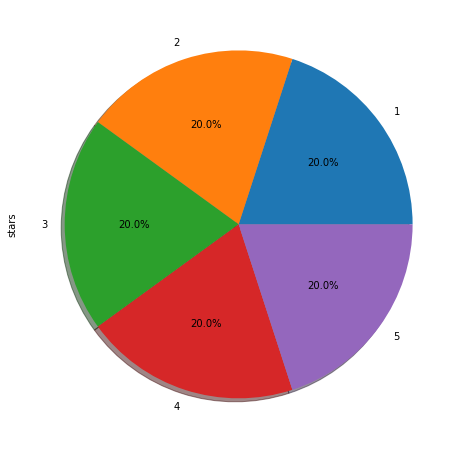

In [32]:
stars_columns.value_counts().plot(kind="pie", figsize=(10, 8), autopct="%1.1f%%", shadow=True)

## 1.2 Distribution de la longueur (nombre de mots) des avis clients

In [33]:
dataset_df["length"] = dataset_df["text"].apply(lambda x: len(x.split()))
dataset_df

,text,stars,length
0,I've only had food from here once and it wasn'...,1,68
1,I will never return here again. Ever. I was ...,1,87
2,I wish my experience was great as others. I di...,1,166
3,Are the rosemary grapefruit scones supposed to...,1,81
4,Our takeout order was half wrong. Food was mis...,1,32
...,...,...,...
24995,I was a loyal fan of Aroy before the ownership...,5,75
24996,Stopped here for a bite while wandering around...,5,55
24997,"A quiet place with excellent food, great music...",5,32
24998,Super delicious food. Awesome vibe. I suffered...,5,41


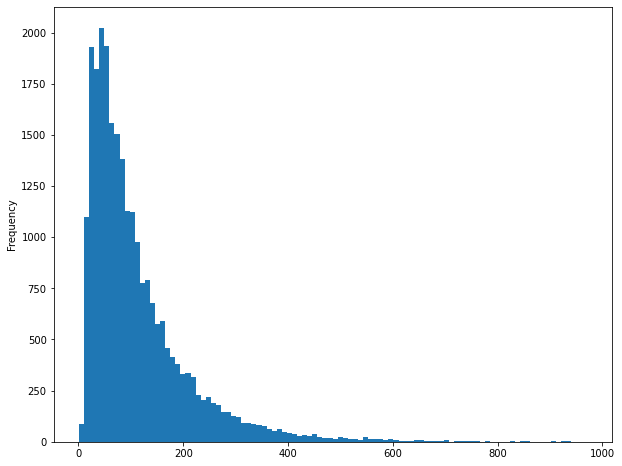

In [34]:
dataset_df.length.plot(kind="hist", bins=100, figsize=(10, 8))

## 1.3 Distribution de la longueur des avis clients en fonction du nombre d'étoiles des avis

Text(0.5, 1.0, "Répartition des longueurs des avis en fonction du nombre d'étoiles")

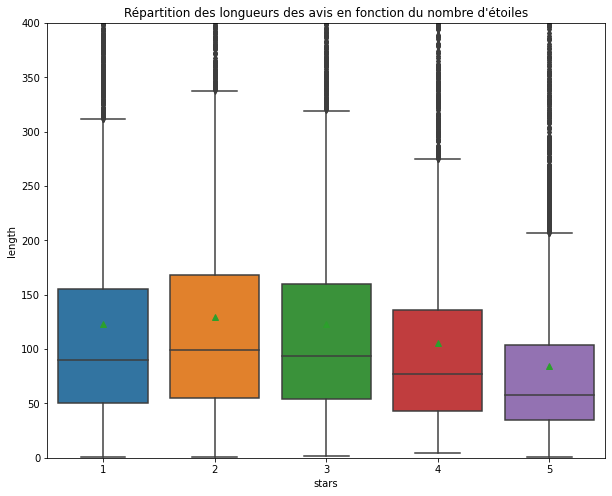

In [35]:
plt.figure(figsize=(10, 8))

ax = sns.boxplot(x=dataset_df.stars ,
            y=dataset_df.length,
            showmeans=True,
            )
ax.set_ylim(0, 400)

ax.set_title("Répartition des longueurs des avis en fonction du nombre d'étoiles")

# 2. Pré-traitement du jeu de données

In [167]:
#contraction
import contractions
for i in range(len(dataset_df)) :
    x= contractions.fix(dataset_df.text[i])
    print(x)
    dataset_df.text[i]=x
dataset_df

I have only had food from here once and it was not memorable. I had Panang curry and the balance in flavor was not there. I like to taste the coconut, lemongrass, and lime, but it was lacking in East Asia's offering. It was way too sweet. I do not care if the owners are not Thai, I will eat anything if it is cooked well, but this place should not claim to serve Thai food.
I will never return here again.  Ever.  I was sitting in my booth waiting for dinner to come out and out scurried a mouse from under my booth and through the dining room.  After immediately getting up to leave, I informed the front desk of this issue and they blew it off as if it was nothing!  They said, oh ya, we have a mouse problem as if it was no big deal.  I will certainly be reporting this to the department of health- that is disgusting!
I wish my experience was great as others. I dined in on a Wednesday night over a week ago and to say the least our meals were horrible. I had the jerk chicken entree and my date

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.

The entrees automatically come with side dishes. It was creamed spinach and mashed potatoes. The mashed potatoes were typical, nothing extraordinary...but very BUTTERY. The creamed spinach tasted like something you could get at a local Chili's restaurant or something of that sort...overly salty. Note: these side dishes are SHARED; you do not get your own plate of it or anything.

Finally, for dessert I got the creme brulee (a taste of heaven! ahhh!) and my boyfriend got the pear sorbet (tasted like real pears...except cold and melts easily). By this point I did not really care to look at the usual prices were but I image it is somewhat pricey just like the rest of the other items. 

TWO THUMBS UP for restaurant week and the FABULOUS view! Oh yes...another reviewer mentioned something about the long wait. I did not find that it was too long, but then again me and my bf came early to prevent this. Our reservat

,text,stars
0,I have only had food from here once and it was...,1
1,I will never return here again. Ever. I was ...,1
2,I wish my experience was great as others. I di...,1
3,Are the rosemary grapefruit scones supposed to...,1
4,Our takeout order was half wrong. Food was mis...,1
...,...,...
24995,I was a loyal fan of Aroy before the ownership...,5
24996,Stopped here for a bite while wandering around...,5
24997,"A quiet place with excellent food, great music...",5
24998,Super delicious food. Awesome vibe. I suffered...,5


In [168]:
def tag_words(sentence):
    import re
    # up to punctuation as in punct, put tags for words
    # following a negative word
    # find punctuation in the sentence
    punct = re.findall(r'[.:;!?]',sentence)[0]
    # create word set from sentence
    wordSet = { x for x in re.split("[.:;!?, ]",sentence) if x }
    keywordSet = {"don't","never", "nothing", "nowhere", "noone", "none", "not",
                  "hasn't","hadn't","can't","couldn't","shouldn't","won't",
                  "wouldn't","don't","doesn't","didn't","isn't","aren't","ain't"}
   
    # find negative words in sentence
    neg_words = wordSet & keywordSet
    if neg_words:
        for word in neg_words:
            start_to_w = sentence[:sentence.find(word)+len(word)]
            # put tags to words after the negative word
            w_to_punct =  re.sub(r'\b([A-Za-z\']+)\b',r'\1_not',
                               sentence[sentence.find(word)+len(word):sentence.find(punct)])
            punct_to_end = sentence[sentence.find(punct):]
            return(start_to_w + w_to_punct + punct_to_end)
    else :
        return(sentence)
  


In [169]:
for i in range(len(dataset_df)) :
    x= tag_words(dataset_df.text[i])
    print(x)
    dataset_df.text[i]=x

I have only had food from here once and it was not memorable_not. I had Panang curry and the balance in flavor was not there. I like to taste the coconut, lemongrass, and lime, but it was lacking in East Asia's offering. It was way too sweet. I do not care if the owners are not Thai, I will eat anything if it is cooked well, but this place should not claim to serve Thai food.
I will never return here again.  Ever.  I was sitting in my booth waiting for dinner to come out and out scurried a mouse from under my booth and through the dining room.  After immediately getting up to leave, I informed the front desk of this issue and they blew it off as if it was nothing.  Ever.  I was sitting in my booth waiting for dinner to come out and out scurried a mouse from under my booth and through the dining room.  After immediately getting up to leave, I informed the front desk of this issue and they blew it off as if it was nothing!  They said, oh ya, we have a mouse problem as if it was no big de

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


IndexError: ignored

In [170]:
dataset_df

,text,stars
0,I have only had food from here once and it was...,1
1,I will never return here again. Ever. I was ...,1
2,I wish my experience was great as others. I di...,1
3,Are the rosemary grapefruit scones supposed to...,1
4,Our takeout order was half wrong. Food was mis...,1
...,...,...
24995,I was a loyal fan of Aroy before the ownership...,5
24996,Stopped here for a bite while wandering around...,5
24997,"A quiet place with excellent food, great music...",5
24998,Super delicious food. Awesome vibe. I suffered...,5


In [171]:
dataset_df.isnull().sum()

text     0
stars    0
dtype: int64

In [172]:
#lowering
for i in range(len(dataset_df)) :
    x= (dataset_df.text[i]).lower()
    print(x)
    dataset_df.text[i]=x

i have only had food from here once and it was not memorable_not. i had panang curry and the balance in flavor was not there. i like to taste the coconut, lemongrass, and lime, but it was lacking in east asia's offering. it was way too sweet. i do not care if the owners are not thai, i will eat anything if it is cooked well, but this place should not claim to serve thai food.
i will never return here again.  ever.  i was sitting in my booth waiting for dinner to come out and out scurried a mouse from under my booth and through the dining room.  after immediately getting up to leave, i informed the front desk of this issue and they blew it off as if it was nothing.  ever.  i was sitting in my booth waiting for dinner to come out and out scurried a mouse from under my booth and through the dining room.  after immediately getting up to leave, i informed the front desk of this issue and they blew it off as if it was nothing!  they said, oh ya, we have a mouse problem as if it was no big de

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.

the entrees automatically come with side dishes. it was creamed spinach and mashed potatoes. the mashed potatoes were typical, nothing extraordinary...but very buttery. the creamed spinach tasted like something you could get at a local chili's restaurant or something of that sort...overly salty. note: these side dishes are shared; you do not get your own plate of it or anything.

finally, for dessert i got the creme brulee (a taste of heaven! ahhh!) and my boyfriend got the pear sorbet (tasted like real pears...except cold and melts easily). by this point i did not really care to look at the usual prices were but i image it is somewhat pricey just like the rest of the other items. 

two thumbs up for restaurant week and the fabulous view! oh yes...another reviewer mentioned something about the long wait. i did not find that it was too long, but then again me and my bf came early to prevent this. our reservat

In [65]:
dataset_df

,text,stars
0,i have only had food from here once and it was...,1
1,i will never return here again. ever. i was ...,1
2,i wish my experience was great as others. i di...,1
3,are the rosemary grapefruit scones supposed to...,1
4,our takeout order was half wrong. food was mis...,1
...,...,...
24995,i was a loyal fan of aroy before the ownership...,5
24996,stopped here for a bite while wandering around...,5
24997,"a quiet place with excellent food, great music...",5
24998,super delicious food. awesome vibe. i suffered...,5


In [173]:
import nltk
from nltk.tokenize import TreebankWordTokenizer
nltk.download('stopwords')
stop_words=nltk.corpus.stopwords.words('english')
import string
string.punctuation
## Tokenization du texte et élemination de stopwords
def remove_stopwords(text):
    output= [i for i in text if i not in stopwords]
    return output
	  


def remove_punctuation(text):
    punctuationfree=" ".join([i for i in text if i not in string.punctuation])
    return punctuationfree
def remove_numbers(text):
    numberfree="".join([i for i in text if i not in string.digits])
    return numberfree
    
def tokenization(sentence):
      tokenizer=TreebankWordTokenizer()
      tokens = tokenizer.tokenize(sentence)   
      return tokens      




[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [174]:
#appliquer tokenization
for i in range(len(dataset_df)) :
    x= tokenization(dataset_df.text[i]) 
    print(x)
    dataset_df.text[i]=x

['i', 'have', 'only', 'had', 'food', 'from', 'here', 'once', 'and', 'it', 'was', 'not', 'memorable_not.', 'i', 'had', 'panang', 'curry', 'and', 'the', 'balance', 'in', 'flavor', 'was', 'not', 'there.', 'i', 'like', 'to', 'taste', 'the', 'coconut', ',', 'lemongrass', ',', 'and', 'lime', ',', 'but', 'it', 'was', 'lacking', 'in', 'east', 'asia', "'s", 'offering.', 'it', 'was', 'way', 'too', 'sweet.', 'i', 'do', 'not', 'care', 'if', 'the', 'owners', 'are', 'not', 'thai', ',', 'i', 'will', 'eat', 'anything', 'if', 'it', 'is', 'cooked', 'well', ',', 'but', 'this', 'place', 'should', 'not', 'claim', 'to', 'serve', 'thai', 'food', '.']
['i', 'will', 'never', 'return', 'here', 'again.', 'ever.', 'i', 'was', 'sitting', 'in', 'my', 'booth', 'waiting', 'for', 'dinner', 'to', 'come', 'out', 'and', 'out', 'scurried', 'a', 'mouse', 'from', 'under', 'my', 'booth', 'and', 'through', 'the', 'dining', 'room.', 'after', 'immediately', 'getting', 'up', 'to', 'leave', ',', 'i', 'informed', 'the', 'front', '

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
['a', 'great', 'setting', 'for', 'a', 'great', 'restaurant', '!', 'the', 'wait', 'staff', 'and', 'hostess', 'make', 'you', 'feel', 'like', 'family', 'and', 'are', 'always', 'personable.', 'the', 'menu', 'is', 'very', 'tasty', 'and', 'the', 'adult', 'beverages', 'quench', 'the', 'hardiest', 'thirst', '!']
['company', 'was', 'like', 'a', '2', 'but', 'our', 'waiter', '(', 'who', 'goes', 'by', 'the', 'alias', 'chad', ')', 'was', 'a', 'solid', '7.', 'maybe', 'even', '8', 'if', 'you', 'are', 'feeling', 'generous', 'or', 'have', 'lower', 'standards.', 'making', 'this', 'experience', 'a', 'full', '10/10', '!', 'cheers', '.']
['so', 'delicious', '!', '!', 'we', 'went', 'during', 'happy', 'hour', 'and', 'ordered', 'mojitos', 'based', 'on', 'our', 'waiters', 'recommendations', ',', 'they', 'were', 'amazing.', 'the', 'food', 'was', 'excellent', ',', 'very', 'well', 'prepared', 'with', 'attention', 'to', 'details', 'and',

In [175]:
#Enlever ponctuation
for i in range(len(dataset_df)) :
    x= remove_punctuation(dataset_df.text[i]) 
    print(x)
    dataset_df.text[i]=x

i have only had food from here once and it was not memorable_not. i had panang curry and the balance in flavor was not there. i like to taste the coconut lemongrass and lime but it was lacking in east asia 's offering. it was way too sweet. i do not care if the owners are not thai i will eat anything if it is cooked well but this place should not claim to serve thai food
i will never return here again. ever. i was sitting in my booth waiting for dinner to come out and out scurried a mouse from under my booth and through the dining room. after immediately getting up to leave i informed the front desk of this issue and they blew it off as if it was nothing. ever. i was sitting in my booth waiting for dinner to come out and out scurried a mouse from under my booth and through the dining room. after immediately getting up to leave i informed the front desk of this issue and they blew it off as if it was nothing they said oh ya we have a mouse problem as if it was no big deal. i will certai

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
a great setting for a great restaurant the wait staff and hostess make you feel like family and are always personable. the menu is very tasty and the adult beverages quench the hardiest thirst
company was like a 2 but our waiter who goes by the alias chad was a solid 7. maybe even 8 if you are feeling generous or have lower standards. making this experience a full 10/10 cheers
so delicious we went during happy hour and ordered mojitos based on our waiters recommendations they were amazing. the food was excellent very well prepared with attention to details and flavors. the restaurant itself was so cute and decorated very well. and our waiter/host was so funny and sweet. also very well educated on the menu
fresh healthy delicious authentic different superb service nice decor a great experience
food was really good burger was juicy and the bun was buttery staff was really helpful as well
lambert 's is great for

In [176]:
dataset_df

,text,stars
0,i have only had food from here once and it was...,1
1,i will never return here again. ever. i was si...,1
2,i wish my experience was great as others. i di...,1
3,are the rosemary grapefruit scones supposed to...,1
4,our takeout order was half wrong. food was mis...,1
...,...,...
24995,i was a loyal fan of aroy before the ownership...,5
24996,stopped here for a bite while wandering around...,5
24997,a quiet place with excellent food great music ...,5
24998,super delicious food. awesome vibe. i suffered...,5


In [177]:
#Enlever les nombres
for i in range(len(dataset_df)) :
    x= remove_numbers(dataset_df.text[i]) 
    print(x)
    dataset_df.text[i]=x

i have only had food from here once and it was not memorable_not. i had panang curry and the balance in flavor was not there. i like to taste the coconut lemongrass and lime but it was lacking in east asia 's offering. it was way too sweet. i do not care if the owners are not thai i will eat anything if it is cooked well but this place should not claim to serve thai food
i will never return here again. ever. i was sitting in my booth waiting for dinner to come out and out scurried a mouse from under my booth and through the dining room. after immediately getting up to leave i informed the front desk of this issue and they blew it off as if it was nothing. ever. i was sitting in my booth waiting for dinner to come out and out scurried a mouse from under my booth and through the dining room. after immediately getting up to leave i informed the front desk of this issue and they blew it off as if it was nothing they said oh ya we have a mouse problem as if it was no big deal. i will certai

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
a great setting for a great restaurant the wait staff and hostess make you feel like family and are always personable. the menu is very tasty and the adult beverages quench the hardiest thirst
company was like a  but our waiter who goes by the alias chad was a solid . maybe even  if you are feeling generous or have lower standards. making this experience a full / cheers
so delicious we went during happy hour and ordered mojitos based on our waiters recommendations they were amazing. the food was excellent very well prepared with attention to details and flavors. the restaurant itself was so cute and decorated very well. and our waiter/host was so funny and sweet. also very well educated on the menu
fresh healthy delicious authentic different superb service nice decor a great experience
food was really good burger was juicy and the bun was buttery staff was really helpful as well
lambert 's is great for grabbi

In [178]:
dataset_df

,text,stars
0,i have only had food from here once and it was...,1
1,i will never return here again. ever. i was si...,1
2,i wish my experience was great as others. i di...,1
3,are the rosemary grapefruit scones supposed to...,1
4,our takeout order was half wrong. food was mis...,1
...,...,...
24995,i was a loyal fan of aroy before the ownership...,5
24996,stopped here for a bite while wandering around...,5
24997,a quiet place with excellent food great music ...,5
24998,super delicious food. awesome vibe. i suffered...,5


In [179]:
#lemmatization
nltk.download('wordnet')
nltk.download('omw-1.4')
from nltk.stem import WordNetLemmatizer
#defining the object for Lemmatization
wordnet_lemmatizer = WordNetLemmatizer()
def lemmatizer(text):
    lemm_text = [wordnet_lemmatizer.lemmatize(word) for word in text]
    return lemm_text

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [180]:
#Appliquer lemmatization
for i in range(len(dataset_df)) :
    x= tokenization(dataset_df.text[i]) 
    x= lemmatizer(x) 
    print(x)
    dataset_df.text[i]=x

['i', 'have', 'only', 'had', 'food', 'from', 'here', 'once', 'and', 'it', 'wa', 'not', 'memorable_not.', 'i', 'had', 'panang', 'curry', 'and', 'the', 'balance', 'in', 'flavor', 'wa', 'not', 'there.', 'i', 'like', 'to', 'taste', 'the', 'coconut', 'lemongrass', 'and', 'lime', 'but', 'it', 'wa', 'lacking', 'in', 'east', 'asia', "'s", 'offering.', 'it', 'wa', 'way', 'too', 'sweet.', 'i', 'do', 'not', 'care', 'if', 'the', 'owner', 'are', 'not', 'thai', 'i', 'will', 'eat', 'anything', 'if', 'it', 'is', 'cooked', 'well', 'but', 'this', 'place', 'should', 'not', 'claim', 'to', 'serve', 'thai', 'food']
['i', 'will', 'never', 'return', 'here', 'again.', 'ever.', 'i', 'wa', 'sitting', 'in', 'my', 'booth', 'waiting', 'for', 'dinner', 'to', 'come', 'out', 'and', 'out', 'scurried', 'a', 'mouse', 'from', 'under', 'my', 'booth', 'and', 'through', 'the', 'dining', 'room.', 'after', 'immediately', 'getting', 'up', 'to', 'leave', 'i', 'informed', 'the', 'front', 'desk', 'of', 'this', 'issue', 'and', 'the

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
['a', 'great', 'setting', 'for', 'a', 'great', 'restaurant', 'the', 'wait', 'staff', 'and', 'hostess', 'make', 'you', 'feel', 'like', 'family', 'and', 'are', 'always', 'personable.', 'the', 'menu', 'is', 'very', 'tasty', 'and', 'the', 'adult', 'beverage', 'quench', 'the', 'hardiest', 'thirst']
['company', 'wa', 'like', 'a', 'but', 'our', 'waiter', 'who', 'go', 'by', 'the', 'alias', 'chad', 'wa', 'a', 'solid', '.', 'maybe', 'even', 'if', 'you', 'are', 'feeling', 'generous', 'or', 'have', 'lower', 'standards.', 'making', 'this', 'experience', 'a', 'full', '/', 'cheer']
['so', 'delicious', 'we', 'went', 'during', 'happy', 'hour', 'and', 'ordered', 'mojitos', 'based', 'on', 'our', 'waiter', 'recommendation', 'they', 'were', 'amazing.', 'the', 'food', 'wa', 'excellent', 'very', 'well', 'prepared', 'with', 'attention', 'to', 'detail', 'and', 'flavors.', 'the', 'restaurant', 'itself', 'wa', 'so', 'cute', 'and', 'dec

In [146]:
data = dataset_df

In [181]:
nltk.download('stopwords')
stopwords = nltk.corpus.stopwords.words('english')
#defining the function to remove stopwords from tokenized text
def remove_stopwords(text):
    output= [i for i in text if i not in stopwords]
    return output

#Appliquer la fonction
for i in range(len(dataset_df)) :
    x= remove_stopwords(dataset_df.text[i]) 
    print(x)
    dataset_df.text[i]=x

['food', 'wa', 'memorable_not.', 'panang', 'curry', 'balance', 'flavor', 'wa', 'there.', 'like', 'taste', 'coconut', 'lemongrass', 'lime', 'wa', 'lacking', 'east', 'asia', "'s", 'offering.', 'wa', 'way', 'sweet.', 'care', 'owner', 'thai', 'eat', 'anything', 'cooked', 'well', 'place', 'claim', 'serve', 'thai', 'food']
['never', 'return', 'again.', 'ever.', 'wa', 'sitting', 'booth', 'waiting', 'dinner', 'come', 'scurried', 'mouse', 'booth', 'dining', 'room.', 'immediately', 'getting', 'leave', 'informed', 'front', 'desk', 'issue', 'blew', 'wa', 'nothing.', 'ever.', 'wa', 'sitting', 'booth', 'waiting', 'dinner', 'come', 'scurried', 'mouse', 'booth', 'dining', 'room.', 'immediately', 'getting', 'leave', 'informed', 'front', 'desk', 'issue', 'blew', 'wa', 'nothing', 'said', 'oh', 'ya', 'mouse', 'problem', 'wa', 'big', 'deal.', 'certainly', 'reporting', 'department', 'health-', 'disgusting']
['wish', 'experience', 'wa', 'great', 'others.', 'dined', 'wednesday', 'night', 'week', 'ago', 'say',

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
['great', 'setting', 'great', 'restaurant', 'wait', 'staff', 'hostess', 'make', 'feel', 'like', 'family', 'always', 'personable.', 'menu', 'tasty', 'adult', 'beverage', 'quench', 'hardiest', 'thirst']
['company', 'wa', 'like', 'waiter', 'go', 'alias', 'chad', 'wa', 'solid', '.', 'maybe', 'even', 'feeling', 'generous', 'lower', 'standards.', 'making', 'experience', 'full', '/', 'cheer']
['delicious', 'went', 'happy', 'hour', 'ordered', 'mojitos', 'based', 'waiter', 'recommendation', 'amazing.', 'food', 'wa', 'excellent', 'well', 'prepared', 'attention', 'detail', 'flavors.', 'restaurant', 'wa', 'cute', 'decorated', 'well.', 'waiter/host', 'wa', 'funny', 'sweet.', 'also', 'well', 'educated', 'menu']
['fresh', 'healthy', 'delicious', 'authentic', 'different', 'superb', 'service', 'nice', 'decor', 'great', 'experience']
['food', 'wa', 'really', 'good', 'burger', 'wa', 'juicy', 'bun', 'wa', 'buttery', 'staff', 'wa

In [182]:
dataset_df

,text,stars
0,"[food, wa, memorable_not., panang, curry, bala...",1
1,"[never, return, again., ever., wa, sitting, bo...",1
2,"[wish, experience, wa, great, others., dined, ...",1
3,"[rosemary, grapefruit, scone, supposed, taste,...",1
4,"[takeout, order, wa, half, wrong., food, wa, m...",1
...,...,...
24995,"[wa, loyal, fan, aroy, ownership, change, wa, ...",5
24996,"[stopped, bite, wandering, around, faneuil, ha...",5
24997,"[quiet, place, excellent, food, great, music, ...",5
24998,"[super, delicious, food., awesome, vibe., suff...",5


In [183]:
data = dataset_df

In [184]:
data.drop( data[ data['stars'] == 3 ].index, inplace=True)

In [185]:
data

,text,stars
0,"[food, wa, memorable_not., panang, curry, bala...",1
1,"[never, return, again., ever., wa, sitting, bo...",1
2,"[wish, experience, wa, great, others., dined, ...",1
3,"[rosemary, grapefruit, scone, supposed, taste,...",1
4,"[takeout, order, wa, half, wrong., food, wa, m...",1
...,...,...
24995,"[wa, loyal, fan, aroy, ownership, change, wa, ...",5
24996,"[stopped, bite, wandering, around, faneuil, ha...",5
24997,"[quiet, place, excellent, food, great, music, ...",5
24998,"[super, delicious, food., awesome, vibe., suff...",5


In [186]:
data.index= range(len(data))

In [187]:
data

,text,stars
0,"[food, wa, memorable_not., panang, curry, bala...",1
1,"[never, return, again., ever., wa, sitting, bo...",1
2,"[wish, experience, wa, great, others., dined, ...",1
3,"[rosemary, grapefruit, scone, supposed, taste,...",1
4,"[takeout, order, wa, half, wrong., food, wa, m...",1
...,...,...
19995,"[wa, loyal, fan, aroy, ownership, change, wa, ...",5
19996,"[stopped, bite, wandering, around, faneuil, ha...",5
19997,"[quiet, place, excellent, food, great, music, ...",5
19998,"[super, delicious, food., awesome, vibe., suff...",5


In [188]:
#transform tokenized Data to text
def transform(text):
    tranformed=" ".join([i for i in text ])
    return tranformed
for i in range(len(data)):
  x=transform(data.text[i])
  print(x)
  data.text[i]=x
data

food wa memorable_not. panang curry balance flavor wa there. like taste coconut lemongrass lime wa lacking east asia 's offering. wa way sweet. care owner thai eat anything cooked well place claim serve thai food
never return again. ever. wa sitting booth waiting dinner come scurried mouse booth dining room. immediately getting leave informed front desk issue blew wa nothing. ever. wa sitting booth waiting dinner come scurried mouse booth dining room. immediately getting leave informed front desk issue blew wa nothing said oh ya mouse problem wa big deal. certainly reporting department health- disgusting
wish experience wa great others. dined wednesday night week ago say least meal horrible. jerk chicken entree date seafood coconut entree. presentation wa nice seafood coconut however date wa displeased literally bite food. couple bite mine. mess jerk chicken could not. dined wednesday night week ago say least meal horrible. jerk chicken entree date seafood coconut entree. presentation 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
great setting great restaurant wait staff hostess make feel like family always personable. menu tasty adult beverage quench hardiest thirst
company wa like waiter go alias chad wa solid . maybe even feeling generous lower standards. making experience full / cheer
delicious went happy hour ordered mojitos based waiter recommendation amazing. food wa excellent well prepared attention detail flavors. restaurant wa cute decorated well. waiter/host wa funny sweet. also well educated menu
fresh healthy delicious authentic different superb service nice decor great experience
food wa really good burger wa juicy bun wa buttery staff wa really helpful well
lambert 's great grabbing quick lunch stocking grocery week. deli salad bar unbelievably good. everything vibrantly fresh staff extremely helpful
great atmosphere.terrific service. industrial chic styling good music plenty seating. coffee good pastry fresh delicious.

,text,stars
0,food wa memorable_not. panang curry balance fl...,1
1,never return again. ever. wa sitting booth wai...,1
2,wish experience wa great others. dined wednesd...,1
3,rosemary grapefruit scone supposed taste like ...,1
4,takeout order wa half wrong. food wa missing p...,1
...,...,...
19995,wa loyal fan aroy ownership change wa apprehen...,5
19996,stopped bite wandering around faneuil hall. pl...,5
19997,quiet place excellent food great music helpful...,5
19998,super delicious food. awesome vibe. suffered d...,5


In [219]:
data.to_csv("file.csv")

In [189]:
#Classification des avis positives et negatives
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.preprocessing import LabelEncoder

import matplotlib.pyplot as plt

x = data.text.values
y = data.stars.values
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=32)

In [192]:
#vectorisation
vectorizer = CountVectorizer()
vectorizer.fit(x_train)

X_train = vectorizer.transform(x_train)
X_test = vectorizer.transform(x_test)

In [201]:
#Modelisation
classifier = LogisticRegression(max_iter=1000,C=1.0)
classifier.fit(X_train, y_train)

score = classifier.score(X_test, y_test)

print("Accuracy:", score)

Accuracy: 0.6225


In [204]:
y_pred = classifier.predict(X_test)
cm = confusion_matrix(y_test, y_pred, labels=data.stars.unique())
df_cm = pd.DataFrame(cm, index=data.stars.unique(), columns=data.stars.unique())
df_cm

,1,2,4,5
1,673,287,19,20
2,284,593,97,44
4,21,89,551,317
5,13,33,286,673


In [208]:
#test
avis = 'this restaurant is horrible'
vectAvis = vectorizer.transform(np.array([avis]))  

prediction = classifier.predict(vectAvis)  
print('Avis', 'positive' if prediction[0]==4 | prediction[0]==5 else 'negative')

Avis negative
